# Descriptografia

In [9]:
from Crypto.PublicKey import RSA
from Crypto.Cipher import PKCS1_OAEP
import base64
import os
import cv2
import time
import matplotlib.pyplot as plt
import numpy as np
import hashlib

In [6]:
with open("RSA_keys/RSA_private.pem", "rb") as priv_file:
    private_key = RSA.import_key(priv_file.read())

cipher = PKCS1_OAEP.new(private_key)

chunk_size = 512

tempos_execucao = []
execucoes = []

for rodagem in range(218, 300):
    inicio = time.perf_counter()
    
    decrypted_chunks = []

    with open(f"RSA_crypto_spectrum_metrics/spectrum_criptografado_{rodagem}.enc", "rb") as enc_file:
        encrypted_data = base64.b64decode(enc_file.read())
        
    for i in range(0, len(encrypted_data), chunk_size):
        chunk = encrypted_data[i : i + chunk_size]
        decrypted_chunk = cipher.decrypt(chunk)
        decrypted_chunks.append(decrypted_chunk)

    decrypted_data = b"".join(decrypted_chunks)

    with open(f"RSA_decrypt_spectrum_metrics/spectrum_descriptografado_{rodagem}.png", "wb") as img_file:
        img_file.write(decrypted_data)

    fim = time.perf_counter()
    tempo_execucao = fim - inicio
    tempos_execucao.append(tempo_execucao)
    execucoes.append(rodagem)

    print(f'Descriptografia finalizada: arquivo {rodagem}')
    print(f"Tempo de execução: {tempo_execucao:.5f} segundos\n")

print(f'\nTempo médio de execução: {np.mean(tempos_execucao):.5f}')

Descriptografia finalizada: arquivo 218
Tempo de execução: 5.82180 segundos

Descriptografia finalizada: arquivo 219
Tempo de execução: 5.77271 segundos

Descriptografia finalizada: arquivo 220
Tempo de execução: 5.76567 segundos

Descriptografia finalizada: arquivo 221
Tempo de execução: 5.73581 segundos

Descriptografia finalizada: arquivo 222
Tempo de execução: 5.72530 segundos

Descriptografia finalizada: arquivo 223
Tempo de execução: 5.98458 segundos

Descriptografia finalizada: arquivo 224
Tempo de execução: 6.05493 segundos

Descriptografia finalizada: arquivo 225
Tempo de execução: 5.79844 segundos

Descriptografia finalizada: arquivo 226
Tempo de execução: 5.73719 segundos

Descriptografia finalizada: arquivo 227
Tempo de execução: 5.71321 segundos

Descriptografia finalizada: arquivo 228
Tempo de execução: 5.86989 segundos

Descriptografia finalizada: arquivo 229
Tempo de execução: 5.76841 segundos

Descriptografia finalizada: arquivo 230
Tempo de execução: 5.92859 segundos


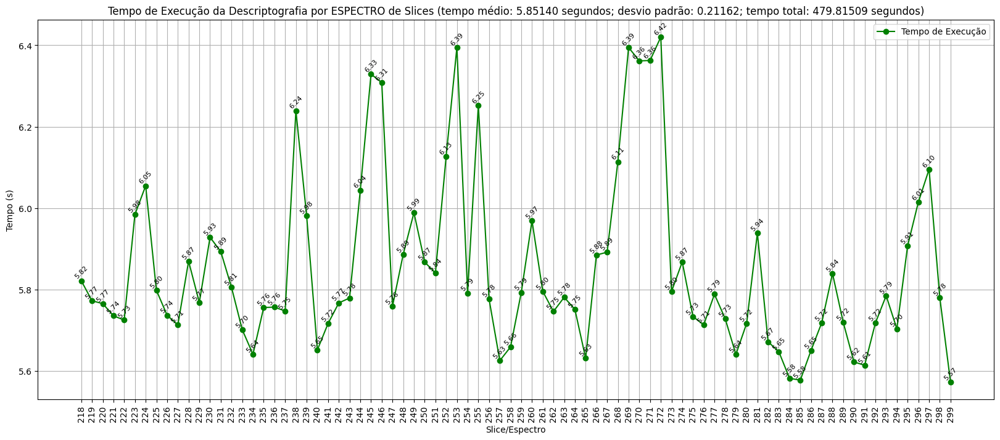

In [7]:
plt.figure(figsize=(20, 8))
plt.plot(execucoes, tempos_execucao, marker='o', linestyle='-', color='g', label='Tempo de Execução')

for x, y in zip(execucoes, tempos_execucao):
    plt.text(x, y + 0.002, f'{y:.2f}', ha='center', va='bottom', fontsize=8, rotation=45)

plt.xticks(execucoes, rotation=90)
plt.xlabel('Slice/Espectro')
plt.ylabel('Tempo (s)')
plt.title(f'Tempo de Execução da Descriptografia por ESPECTRO de Slices (tempo médio: {np.mean(tempos_execucao):.5f} segundos; desvio padrão: {np.std(tempos_execucao, ddof=0):.5f}; tempo total: {np.sum(tempos_execucao):.5f} segundos)')
plt.legend()
plt.grid(True)

plt.savefig('output_images/graph_tempo_execucao_descriptografia_espectro.png')

plt.show()

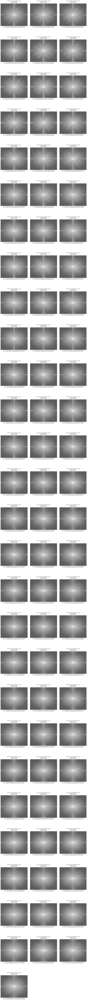

In [10]:
def gerar_hash_sha3_256(dados):
    hash_obj = hashlib.sha3_256(dados)
    return hash_obj.hexdigest()

# Pastas
pasta_original = r"C:\Users\CarlosChinen\OneDrive\Main\FEI\TCC\Criptografia\criptografia\DATASET_dicom_fourier_spectrum"
pasta_descriptografada = r'C:\Users\CarlosChinen\OneDrive\Main\FEI\TCC\Criptografia\criptografia\RSA_decrypt_spectrum_metrics'

# Lista de arquivos descriptografados
descriptografadas = [f for f in os.listdir(pasta_descriptografada) if f.endswith(".png")]

# Número de imagens
n = len(descriptografadas)
cols = 3
rows = (n + cols - 1) // cols

# Aumenta altura da figura para comportar os hashes
plt.figure(figsize=(15, 6 * rows))

for i, nome_arquivo_desc in enumerate(descriptografadas):
    caminho_desc = os.path.join(pasta_descriptografada, nome_arquivo_desc)

    identificador = ''.join(filter(str.isdigit, nome_arquivo_desc))
    nome_arquivo_original = f"spectrum_slice_{identificador}.png"
    caminho_original = os.path.join(pasta_original, nome_arquivo_original)

    image = cv2.imread(caminho_desc)

    try:
        with open(caminho_original, "rb") as img_file:
            imagem_original = img_file.read()
        hash_original = gerar_hash_sha3_256(imagem_original)
    except FileNotFoundError:
        hash_original = "Arquivo não encontrado"

    with open(caminho_desc, "rb") as img_file:
        imagem_desc = img_file.read()
    hash_desc = gerar_hash_sha3_256(imagem_desc)

    hash_valido = (hash_original == hash_desc) if hash_original != "Arquivo não encontrado" else False

    ax = plt.subplot(rows, cols, i + 1)
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.axis('off')

    titulo = f"{nome_arquivo_desc}"
    if 'tempos_execucao' in globals() and i < len(tempos_execucao):
        titulo += f"\nTempo: {tempos_execucao[i]:.5f}s"
    titulo += f"\nHash Válido: {'Sim' if hash_valido else 'Não'}"
    ax.set_title(titulo, fontsize=9)

    hash_original_str = hash_original if isinstance(hash_original, str) else "Erro"
    ax.text(0.5, -0.02, f"Hash 1: {hash_original_str}", fontsize=6, ha='center', va='top', transform=ax.transAxes)
    ax.text(0.5, -0.05, f"Hash 2: {hash_desc}", fontsize=6, ha='center', va='top', transform=ax.transAxes)

# Ajusta espaço inferior para os textos abaixo da imagem
plt.subplots_adjust(bottom=0.05)
plt.tight_layout()
plt.show()